<a href="https://colab.research.google.com/github/Urara29/music_CVAE/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#カレントディレクトリに移動
%cd "/content/drive/My Drive/sotsuron/"

/content/drive/My Drive/sotsuron


In [4]:
#!/opt/conda/bin/python3.7 -m pip install --upgrade pip
#!pip install tensorflow-addons
#!pip install --upgrade --ignore-installed tensorflow
#!pip install -q imageio
!pip install -q git+https://github.com/tensorflow/docs

  Preparing metadata (setup.py) ... done


In [5]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.7 MB/s eta 0:00:00


In [81]:
import librosa

import numpy as np
import pandas as pd
from PIL import Image
import os

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import matplotlib.pyplot as plt
from IPython import display
from IPython.display import clear_output

import glob
import imageio
import time
import IPython.display as ipd

import keras
from keras.layers import Dense, Conv2D, BatchNormalization, Conv2DTranspose, Activation, Flatten, Dropout, Reshape, GlobalAveragePooling2D, MaxPooling2D
from keras.layers import LeakyReLU
from keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model
from keras.callbacks import EarlyStopping

AUTOTUNE = tf.data.experimental.AUTOTUNE

In [7]:
#パラメータ
f = '/content/drive/MyDrive/sotsuron/AE_face2/jaffedbase/jaffedbase/'
f2 =  '/content/drive/MyDrive/sotsuron/AE_face2/jaffedbase/test/'
z_dim = 100
opt = keras.optimizers.Adam(learning_rate=0.0001)
img_f = '/content/drive/MyDrive/sotsuron/AE_face2/AE_img/'

#訓練データ
x_train = []
files = os.listdir(f)
for file in files:
    img = Image.open(f + file).convert("RGB"); img.close
    x_train.append(np.array(img))
x_train = np.array(x_train)
x_train = (x_train - 127.5) / 127.5

#テストデータ
x_check = []
files2 = os.listdir(f2)
for file in files2:
    img = Image.open(f2 + file).convert("RGB"); img.close
    x_check.append(np.array(img))
x_check = np.array(x_check)
x_check = (x_check - 127.5) / 127.5

#入力と出力は同じ
y_train = x_train

print(x_train.shape)

(202, 256, 256, 3)


In [8]:
#モデルの定義
def encoder_model():
    model = Sequential()
    
    model.add(Conv2D(32, (4, 4), strides=(2, 2), padding='same', input_shape=(256, 256, 3)))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2D(64, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    model.add(Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    model.add(Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2D(512, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    model.add(Flatten())
    model.add(Dropout(0.5))

    model.add(Dense(z_dim))
    model.add(Activation('tanh'))
    
    return model

def decoder_model():
    model = Sequential()
    
    model.add(Dense(8*8*512, input_shape=(z_dim, )))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Reshape((8, 8, 512)))
    model.add(Dropout(0.5))

    model.add(Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same'))
    model.add(Activation('tanh'))
    
    return model

def autoencoder_model(encoder, decoder):
    model = Sequential()
    model.add(encoder)
    model.add(decoder)
    return model

In [9]:
#モデルの生成

#encoderの生成
encoder = encoder_model()
encoder.summary()
#decoderの生成
decoder = decoder_model()
decoder.summary()
#autoencoderの作成
autoencoder = autoencoder_model(encoder, decoder)
autoencoder.summary()

#autoencoderのコンパイル
autoencoder.compile(loss='msle', optimizer=opt)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      1568      
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 32)     128       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        32832     
                                                                 
 batch_normalization_1 (Batc  (None, 64, 64, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 64)        0

In [10]:
#学習中のログ
#======================================
class EpisodeLogger(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        
        #一定epoch毎に画像表示
        if epoch % 10 == 0:
            #======================================
            x_ans = autoencoder.predict(x_check)

            stack1 = np.concatenate(x_check, axis=1)
            stack2 = np.concatenate(x_ans, axis=1)
            stack3 = np.concatenate([stack1, stack2], axis=0)
            img = Image.fromarray(np.uint8(stack3 * 127.5 + 127.5))

            plt.figure(figsize=(10, 10))
            img.save(img_f + str(epoch) + '.png')
            plt.imshow(img, vmin = 0, vmax = 255)
            plt.show()
            #======================================
        

1/1 [==============================] - 2s 2s/step


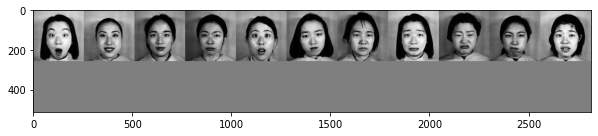

Epoch 1/100
7/7 - 70s - loss: 0.0530 - 70s/epoch - 10s/step
Epoch 2/100
7/7 - 39s - loss: 0.0400 - 39s/epoch - 6s/step
Epoch 3/100
7/7 - 39s - loss: 0.0358 - 39s/epoch - 6s/step
Epoch 4/100
7/7 - 50s - loss: 0.0336 - 50s/epoch - 7s/step
Epoch 5/100
7/7 - 42s - loss: 0.0323 - 42s/epoch - 6s/step
Epoch 6/100
7/7 - 40s - loss: 0.0312 - 40s/epoch - 6s/step
Epoch 7/100
7/7 - 37s - loss: 0.0304 - 37s/epoch - 5s/step
Epoch 8/100
7/7 - 38s - loss: 0.0298 - 38s/epoch - 5s/step
Epoch 9/100
7/7 - 46s - loss: 0.0291 - 46s/epoch - 7s/step
Epoch 10/100
7/7 - 37s - loss: 0.0283 - 37s/epoch - 5s/step
1/1 [==============================] - 1s 642ms/step


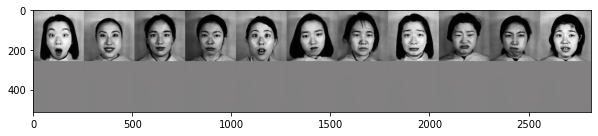

Epoch 11/100
7/7 - 37s - loss: 0.0277 - 37s/epoch - 5s/step
Epoch 12/100
7/7 - 39s - loss: 0.0263 - 39s/epoch - 6s/step
Epoch 13/100
7/7 - 41s - loss: 0.0251 - 41s/epoch - 6s/step
Epoch 14/100
7/7 - 37s - loss: 0.0230 - 37s/epoch - 5s/step
Epoch 15/100
7/7 - 38s - loss: 0.0223 - 38s/epoch - 5s/step
Epoch 16/100
7/7 - 37s - loss: 0.0209 - 37s/epoch - 5s/step
Epoch 17/100
7/7 - 41s - loss: 0.0200 - 41s/epoch - 6s/step
Epoch 18/100
7/7 - 37s - loss: 0.0196 - 37s/epoch - 5s/step
Epoch 19/100
7/7 - 38s - loss: 0.0196 - 38s/epoch - 5s/step
Epoch 20/100
7/7 - 37s - loss: 0.0189 - 37s/epoch - 5s/step
1/1 [==============================] - 1s 657ms/step


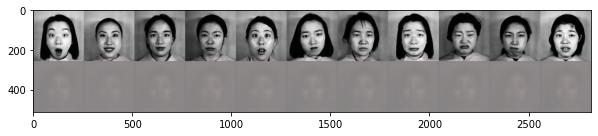

Epoch 21/100
7/7 - 37s - loss: 0.0186 - 37s/epoch - 5s/step
Epoch 22/100
7/7 - 41s - loss: 0.0180 - 41s/epoch - 6s/step
Epoch 23/100
7/7 - 37s - loss: 0.0178 - 37s/epoch - 5s/step
Epoch 24/100
7/7 - 38s - loss: 0.0170 - 38s/epoch - 5s/step
Epoch 25/100
7/7 - 37s - loss: 0.0164 - 37s/epoch - 5s/step
Epoch 26/100
7/7 - 37s - loss: 0.0179 - 37s/epoch - 5s/step
Epoch 27/100
7/7 - 37s - loss: 0.0153 - 37s/epoch - 5s/step
Epoch 28/100
7/7 - 41s - loss: 0.0145 - 41s/epoch - 6s/step
Epoch 29/100
7/7 - 37s - loss: 0.0140 - 37s/epoch - 5s/step
Epoch 30/100
7/7 - 37s - loss: 0.0132 - 37s/epoch - 5s/step
1/1 [==============================] - 1s 634ms/step


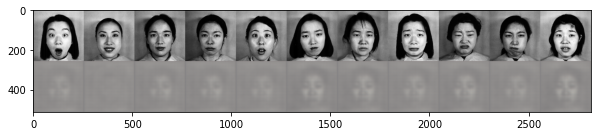

Epoch 31/100
7/7 - 51s - loss: 0.0125 - 51s/epoch - 7s/step
Epoch 32/100
7/7 - 42s - loss: 0.0123 - 42s/epoch - 6s/step
Epoch 33/100
7/7 - 42s - loss: 0.0113 - 42s/epoch - 6s/step
Epoch 34/100
7/7 - 40s - loss: 0.0107 - 40s/epoch - 6s/step
Epoch 35/100
7/7 - 40s - loss: 0.0099 - 40s/epoch - 6s/step
Epoch 36/100
7/7 - 38s - loss: 0.0097 - 38s/epoch - 5s/step
Epoch 37/100
7/7 - 39s - loss: 0.0095 - 39s/epoch - 6s/step
Epoch 38/100
7/7 - 38s - loss: 0.0092 - 38s/epoch - 5s/step
Epoch 39/100
7/7 - 42s - loss: 0.0089 - 42s/epoch - 6s/step
Epoch 40/100
7/7 - 38s - loss: 0.0089 - 38s/epoch - 5s/step
1/1 [==============================] - 1s 643ms/step


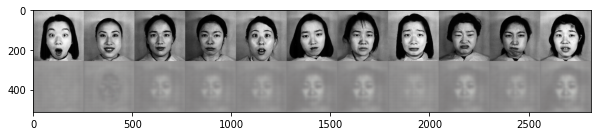

Epoch 41/100
7/7 - 38s - loss: 0.0088 - 38s/epoch - 5s/step
Epoch 42/100
7/7 - 38s - loss: 0.0086 - 38s/epoch - 5s/step
Epoch 43/100
7/7 - 38s - loss: 0.0084 - 38s/epoch - 5s/step
Epoch 44/100
7/7 - 38s - loss: 0.0084 - 38s/epoch - 5s/step
Epoch 45/100
7/7 - 42s - loss: 0.0082 - 42s/epoch - 6s/step
Epoch 46/100
7/7 - 38s - loss: 0.0084 - 38s/epoch - 5s/step
Epoch 47/100
7/7 - 37s - loss: 0.0079 - 37s/epoch - 5s/step
Epoch 48/100
7/7 - 38s - loss: 0.0079 - 38s/epoch - 5s/step
Epoch 49/100
7/7 - 38s - loss: 0.0076 - 38s/epoch - 5s/step
Epoch 50/100
7/7 - 37s - loss: 0.0078 - 37s/epoch - 5s/step
1/1 [==============================] - 1s 634ms/step


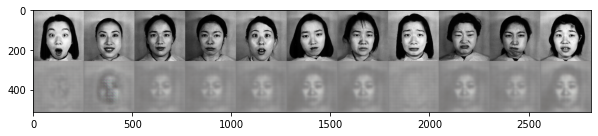

Epoch 51/100
7/7 - 42s - loss: 0.0079 - 42s/epoch - 6s/step
Epoch 52/100
7/7 - 37s - loss: 0.0074 - 37s/epoch - 5s/step
Epoch 53/100
7/7 - 38s - loss: 0.0074 - 38s/epoch - 5s/step
Epoch 54/100
7/7 - 38s - loss: 0.0075 - 38s/epoch - 5s/step
Epoch 55/100
7/7 - 38s - loss: 0.0079 - 38s/epoch - 5s/step
Epoch 56/100
7/7 - 37s - loss: 0.0079 - 37s/epoch - 5s/step
Epoch 57/100
7/7 - 42s - loss: 0.0074 - 42s/epoch - 6s/step
Epoch 58/100
7/7 - 38s - loss: 0.0074 - 38s/epoch - 5s/step
Epoch 59/100
7/7 - 38s - loss: 0.0072 - 38s/epoch - 5s/step
Epoch 60/100
7/7 - 38s - loss: 0.0072 - 38s/epoch - 5s/step
1/1 [==============================] - 1s 647ms/step


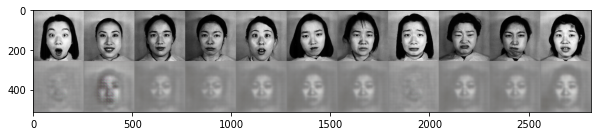

Epoch 61/100
7/7 - 38s - loss: 0.0072 - 38s/epoch - 5s/step
Epoch 62/100
7/7 - 41s - loss: 0.0070 - 41s/epoch - 6s/step
Epoch 63/100
7/7 - 38s - loss: 0.0070 - 38s/epoch - 5s/step
Epoch 64/100
7/7 - 38s - loss: 0.0069 - 38s/epoch - 5s/step
Epoch 65/100
7/7 - 38s - loss: 0.0069 - 38s/epoch - 5s/step
Epoch 66/100
7/7 - 38s - loss: 0.0069 - 38s/epoch - 5s/step
Epoch 67/100
7/7 - 38s - loss: 0.0066 - 38s/epoch - 5s/step
Epoch 68/100
7/7 - 42s - loss: 0.0066 - 42s/epoch - 6s/step
Epoch 69/100
7/7 - 38s - loss: 0.0065 - 38s/epoch - 5s/step
Epoch 70/100
7/7 - 38s - loss: 0.0065 - 38s/epoch - 5s/step
1/1 [==============================] - 1s 642ms/step


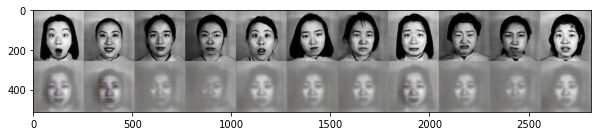

Epoch 71/100
7/7 - 38s - loss: 0.0065 - 38s/epoch - 5s/step
Epoch 72/100
7/7 - 38s - loss: 0.0066 - 38s/epoch - 5s/step
Epoch 73/100
7/7 - 38s - loss: 0.0065 - 38s/epoch - 5s/step
Epoch 74/100
7/7 - 42s - loss: 0.0064 - 42s/epoch - 6s/step
Epoch 75/100
7/7 - 38s - loss: 0.0064 - 38s/epoch - 5s/step
Epoch 76/100
7/7 - 38s - loss: 0.0066 - 38s/epoch - 5s/step
Epoch 77/100
7/7 - 38s - loss: 0.0066 - 38s/epoch - 5s/step
Epoch 78/100
7/7 - 38s - loss: 0.0063 - 38s/epoch - 5s/step
Epoch 79/100
7/7 - 42s - loss: 0.0063 - 42s/epoch - 6s/step
Epoch 80/100
7/7 - 37s - loss: 0.0063 - 37s/epoch - 5s/step
1/1 [==============================] - 1s 633ms/step


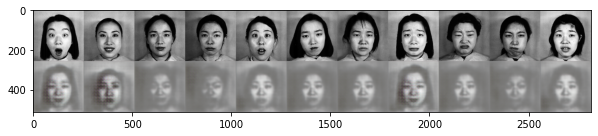

Epoch 81/100
7/7 - 37s - loss: 0.0062 - 37s/epoch - 5s/step
Epoch 82/100
7/7 - 38s - loss: 0.0060 - 38s/epoch - 5s/step
Epoch 83/100
7/7 - 37s - loss: 0.0064 - 37s/epoch - 5s/step
Epoch 84/100
7/7 - 41s - loss: 0.0060 - 41s/epoch - 6s/step
Epoch 85/100
7/7 - 37s - loss: 0.0061 - 37s/epoch - 5s/step
Epoch 86/100
7/7 - 38s - loss: 0.0064 - 38s/epoch - 5s/step
Epoch 87/100
7/7 - 37s - loss: 0.0061 - 37s/epoch - 5s/step
Epoch 88/100
7/7 - 41s - loss: 0.0065 - 41s/epoch - 6s/step
Epoch 89/100
7/7 - 37s - loss: 0.0063 - 37s/epoch - 5s/step
Epoch 90/100
7/7 - 38s - loss: 0.0063 - 38s/epoch - 5s/step
1/1 [==============================] - 1s 649ms/step


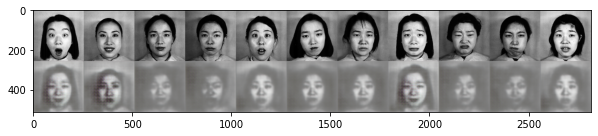

Epoch 91/100
7/7 - 37s - loss: 0.0061 - 37s/epoch - 5s/step
Epoch 92/100
7/7 - 41s - loss: 0.0057 - 41s/epoch - 6s/step
Epoch 93/100
7/7 - 37s - loss: 0.0064 - 37s/epoch - 5s/step
Epoch 94/100
7/7 - 38s - loss: 0.0055 - 38s/epoch - 5s/step
Epoch 95/100
7/7 - 38s - loss: 0.0056 - 38s/epoch - 5s/step
Epoch 96/100
7/7 - 41s - loss: 0.0055 - 41s/epoch - 6s/step
Epoch 97/100
7/7 - 38s - loss: 0.0058 - 38s/epoch - 5s/step
Epoch 98/100
7/7 - 37s - loss: 0.0057 - 37s/epoch - 5s/step
Epoch 99/100
7/7 - 37s - loss: 0.0054 - 37s/epoch - 5s/step
Epoch 100/100
7/7 - 41s - loss: 0.0054 - 41s/epoch - 6s/step


In [11]:
#学習
hist = autoencoder.fit(x_train, y_train, epochs=100, batch_size=32, verbose=2, callbacks=[EpisodeLogger()])

In [39]:
encoder_para = '/content/drive/MyDrive/sotsuron/AE_face2/h5_para/'
encoder.save(encoder_para + 'encoder_main.h5')

潜在変数

ここから音楽部

In [57]:
seed=123
tf.compat.v1.set_random_seed(seed)
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

In [58]:
BATCH_SIZE = 10
epochs = 26
latent_dim = 2
num_examples_to_generate = 10

BASE_PATH = './AE_music'

In [59]:
def DatasetLoader(class_):
    music_list = np.array(sorted(os.listdir(BASE_PATH+'/'+class_)))
    #music_list2 = np.array(sorted(os.listdir(BASE_PATH+'/test')))
    train_music_1 = list(music_list[[12,52,119,333,71,212,175,285,33,245,224,146,88]])
    train_music_2 = list(music_list[[0,1,2,80,81,82,159,160,161,252,253,254]])
    TrackSet_1 = [(BASE_PATH)+'/'+class_+'/%s'%(x) for x in train_music_1]
    TrackSet_2 = [(BASE_PATH)+'/'+class_+'/%s'%(x) for x in train_music_2]

    return TrackSet_1, TrackSet_2

In [60]:
def load(file_):
    data_, sampling_rate = librosa.load(file_,sr=22050, offset=0.0, duration=7)
    data_ = data_.reshape(1,154350)
    return data_
map_data = lambda filename: tf.compat.v1.py_func(load, [filename], [tf.float32])

In [61]:
TrackSet_1, TrackSet_2 = DatasetLoader('e1_to_e4')

In [62]:
sample = TrackSet_1[2]
sample_, sampling_rate = librosa.load(sample,sr=22050, offset=0.0, duration=7)
ipd.Audio(sample_,rate=22050)

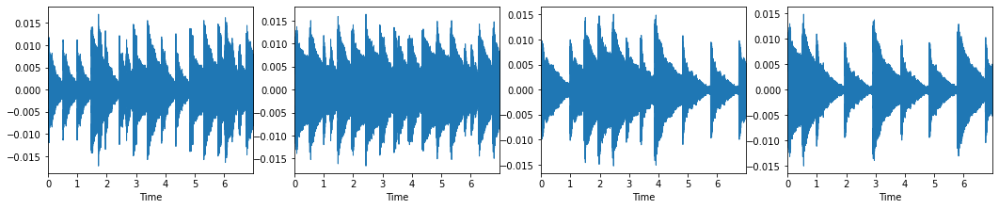

In [63]:
import librosa.display
plt.figure(figsize=(18,15))
for i in range(4):
    plt.subplot(4, 4, i + 1)
    j = load(TrackSet_1[i])
    librosa.display.waveplot(j[0], sr=22050)

In [64]:
train_dataset = (
    tf.data.Dataset
    .from_tensor_slices((TrackSet_1))
    .map(map_data, num_parallel_calls=AUTOTUNE)
    .shuffle(3)
    .batch(BATCH_SIZE)
)
test_dataset = (
    tf.data.Dataset
    .from_tensor_slices((TrackSet_2))
    .map(map_data, num_parallel_calls=AUTOTUNE)
    .shuffle(3)
    .batch(BATCH_SIZE)
)

In [65]:
class Resnet1DBlock(tf.keras.Model):
    def __init__(self, kernel_size, filters,type='encode'):
        super(Resnet1DBlock, self).__init__()
    
        if type=='encode':
            self.conv1a = layers.Conv1D(filters, kernel_size, 2,padding="same")
            self.conv1b = layers.Conv1D(filters, kernel_size, 1,padding="same")
            self.norm1a = tfa.layers.InstanceNormalization()
            self.norm1b = tfa.layers.InstanceNormalization()
        if type=='decode':
            self.conv1a = layers.Conv1DTranspose(filters, kernel_size, 1,padding="same")
            self.conv1b = layers.Conv1DTranspose(filters, kernel_size, 1,padding="same")
            self.norm1a = tf.keras.layers.BatchNormalization()
            self.norm1b = tf.keras.layers.BatchNormalization()
        else:
            return None

    def call(self, input_tensor):
        x = tf.nn.relu(input_tensor)
        x = self.conv1a(x)
        x = self.norm1a(x)
        x = layers.LeakyReLU(0.4)(x)

        x = self.conv1b(x)
        x = self.norm1b(x)
        x = layers.LeakyReLU(0.4)(x)

        x += input_tensor
        return tf.nn.relu(x)

In [66]:
class CVAE(tf.keras.Model):
    """Convolutional variational autoencoder."""

    def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(1,154350)),
                layers.Conv1D(64,1,2),
                Resnet1DBlock(64,1),
                layers.Conv1D(128,1,2),
                Resnet1DBlock(128,1),
                layers.Conv1D(128,1,2),
                Resnet1DBlock(128,1),
                layers.Conv1D(256,1,2),
                Resnet1DBlock(256,1),
                # No activation
                layers.Flatten(),
                layers.Dense(latent_dim+latent_dim)

            ]
        )
        self.decoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
                layers.Reshape(target_shape=(1,latent_dim)),
                Resnet1DBlock(512,1,'decode'),
                layers.Conv1DTranspose(512,1,1),
                Resnet1DBlock(256,1,'decode'),
                layers.Conv1DTranspose(256,1,1),
                Resnet1DBlock(128,1,'decode'),
                layers.Conv1DTranspose(128,1,1),
                Resnet1DBlock(64,1,'decode'),
                layers.Conv1DTranspose(64,1,1),
                # No activation
                layers.Conv1DTranspose(154350,1,1),
            ]
        )
    @tf.function
    def sample(self, eps=None):
        if eps is None:
            eps = tf.random.normal(shape=(200, self.latent_dim))
        return self.decode(eps, apply_sigmoid=True)
    @tf.function
    def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar
    @tf.function
    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean
    @tf.function
    def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
            probs = tf.sigmoid(logits)
            return probs
        return logits

In [67]:
optimizer = tf.keras.optimizers.Adam(0.0003,beta_1=0.9, beta_2=0.999,epsilon=1e-08)

In [68]:
@tf.function
def log_normal_pdf(sample, mean, logvar, raxis=1):
    log2pi = tf.math.log(2. * np.pi)
    return tf.reduce_sum(
         -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
          axis=raxis)

In [69]:
@tf.function
def compute_loss(model, x):
    mean, logvar = model.encode(x)
    z = model.reparameterize(mean, logvar)
    x_logit = model.decode(z)
    cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
    logpx_z = -tf.reduce_sum(cross_ent, axis=[1,2])
    logpz = log_normal_pdf(z, 0., 0.)
    logqz_x = log_normal_pdf(z, mean, logvar)
    return -tf.reduce_mean(logpx_z + logpz - logqz_x)

In [70]:
@tf.function
def train_step(model, x, optimizer):
    
    """Executes one training step and returns the loss.

       This function computes the loss and gradients, and uses the latter to
       update the model's parameters.
     """
    with tf.GradientTape() as tape:
            mean, logvar = model.encode(x)
            z = model.reparameterize(mean, logvar)
            x_logit = model.decode(z)
            cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
            logpx_z = -tf.reduce_sum(cross_ent, axis=[1,2])
            logpz = log_normal_pdf(z, 0., 0.)
            logqz_x = log_normal_pdf(z, mean, logvar)
            loss_KL = -tf.reduce_mean(logpx_z + logpz - logqz_x)
            reconstruction_loss = tf.reduce_mean(
                     tf.keras.losses.binary_crossentropy(x, x_logit)
                 )
            total_loss = reconstruction_loss+ loss_KL
    gradients = tape.gradient(total_loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [71]:
# keeping the random vector constant for generation (prediction) so it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(
    shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim)

In [72]:
import librosa.display

def generate_and_save_images(model, epoch, test_sample, save):
    mean, logvar = model.encode(test_sample)
    z = model.reparameterize(mean, logvar)
    predictions = model.sample(z)
    fig = plt.figure(figsize=(18, 15))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        wave = np.asarray(predictions[i])
        librosa.display.waveplot(wave[0], sr=22050)

    # tight_layout minimizes the overlap between 2 sub-plots
    plt.savefig('{}_{:04d}.png'.format(save, epoch))
    plt.savefig('{}_{:04d}.png'.format(save, epoch))
    plt.show()

In [73]:
# Pick a sample of the test set for generating output images
assert BATCH_SIZE >= num_examples_to_generate
for test_batch in test_dataset.take(1):
    test_sample = test_batch[0]

Epoch: 26, Test set ELBO: -1548.5938720703125, time elapse for current epoch: 4.187220573425293


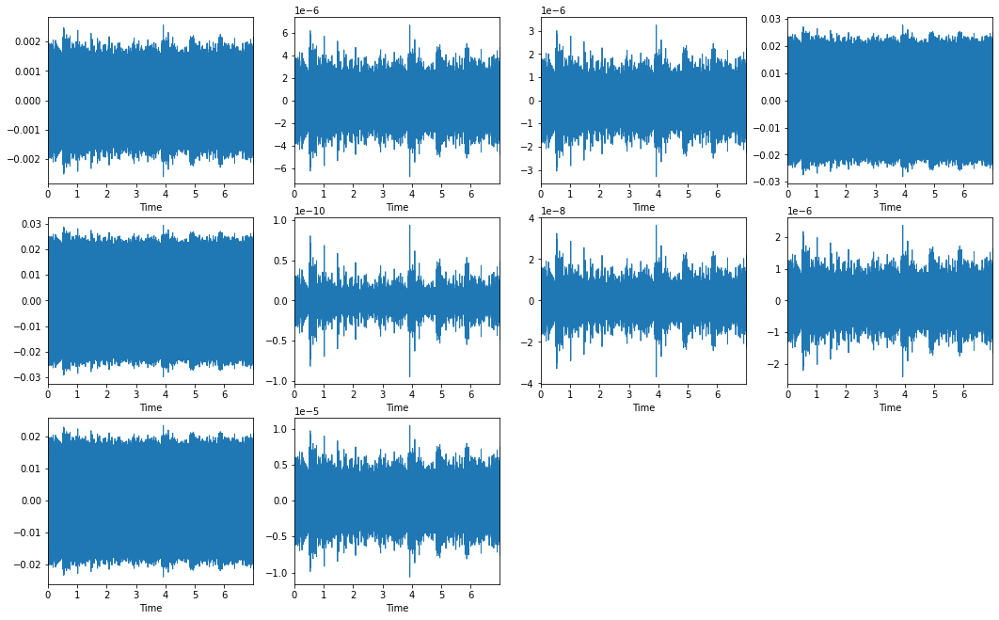

In [74]:
generate_and_save_images(model, 0, test_sample, 'e1_to_e4')
def train(train_dataset, test_dataset, model, save):
    for epoch in range(1, epochs + 1):
        start_time = time.time()
        for train_x in train_dataset:
            train_x = np.asarray(train_x)[0]
            train_step(model, train_x, optimizer)
        end_time = time.time()

        loss = tf.keras.metrics.Mean()
        for test_x in test_dataset:
            test_x = np.asarray(test_x)[0]
            loss(compute_loss(model, test_x))
        display.clear_output(wait=False)
        elbo = -loss.result()
        print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'.format(epoch, 
                                                                                       elbo, 
                                                                                       end_time - start_time
                                                                                      ))
        generate_and_save_images(model,
                                 epoch, 
                                 test_sample,
                                 save)
train(train_dataset, test_dataset, model, 'e1_to_e4')

In [75]:
anim_file_1 = 'e1_to_e4_cvae.gif'

with imageio.get_writer(anim_file_1, mode='I') as writer:
    filenames = glob.glob('e1_to_e4*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)


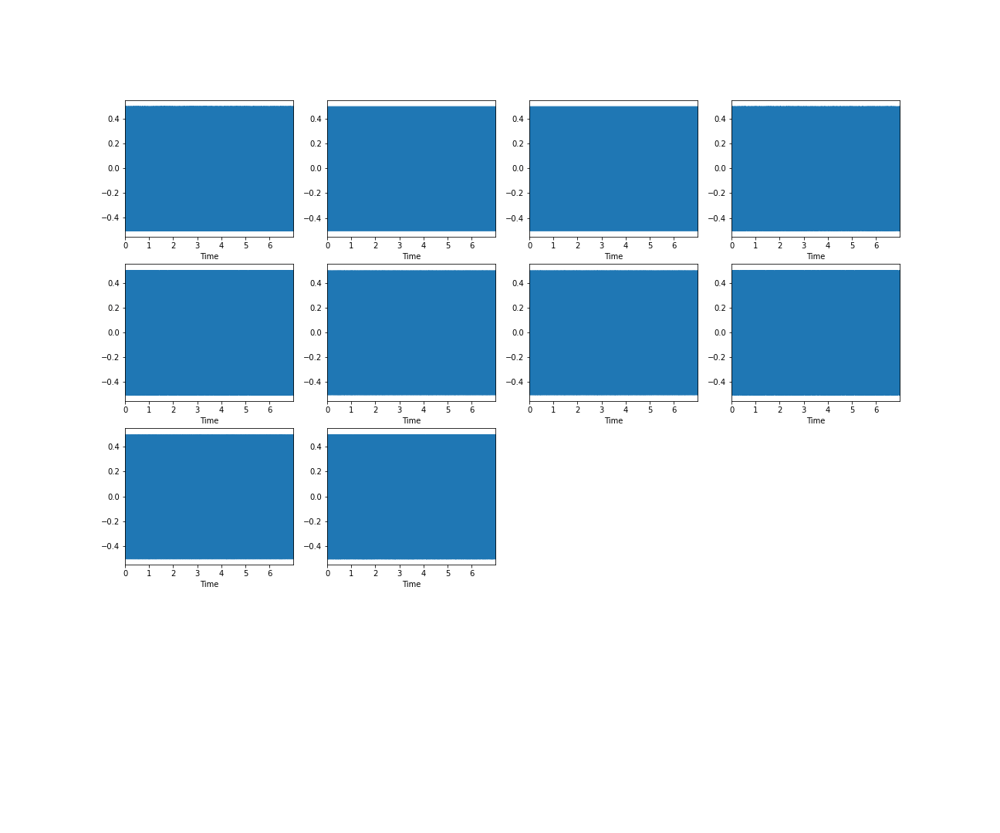

In [76]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file_1)

In [77]:
def inference(test_dataset, model):  
    save_music = []
    for test in test_dataset:
        mean, logvar = model.encode(test)
        z = model.reparameterize(mean, logvar)
        predictions = model.sample(z)
        for pred in predictions:
            wave = np.asarray(pred)
            save_music.append(wave)
    return save_music

saved_musics = inference(test_dataset, model)

In [78]:
music1=saved_musics[0][0]
ipd.Audio(music1,rate=22050)


In [ ]:
music2=saved_musics[9][0]
ipd.Audio(music2,rate=22050)

In [ ]:
music3=saved_musics[5][0]
ipd.Audio(music3,rate=22050)

In [ ]:
music4=saved_musics[10][0]
ipd.Audio(music4,rate=22050)

In [ ]:
music5=saved_musics[8][0]
ipd.Audio(music5,rate=22050)

In [ ]:
music6=saved_musics[7][0]
ipd.Audio(music6,rate=22050)

ここから連結部

In [41]:
from tensorflow.python.keras.models import load_model

#モデルを読み込み
encoder_model = load_model(encoder_para + 'encoder_main.h5')
encoder_model.summary() #モデル情報を出力

ValueError: ignored

In [79]:
class Img_Music_Autoencoder(CVAE):
    def __init__(self):
        super(CVAE, self).__init__()

        #encoderの生成
        encoder = encoder_model()
        encoder.summary()
        #decoderの生成
        decoder = CVAE.decode(self, z, apply_sigmoid=False)
        decoder.summary()

In [82]:
def Img_Music_Autoencoder_model(encoder, decoder):
    model = Sequential()
    model.add(encoder)
    model.add(decoder)
    return model

#autoencoderの作成
autoencoder = Img_Music_Autoencoder_model(encoder, decoder)
autoencoder.summary()

#autoencoderのコンパイル
autoencoder.compile(loss='msle', optimizer=opt)

TypeError: ignored